### IMPORTING DEPENDENCIES

In [1]:
#IMPORTING NECESSARY LIBRARIES
import pandas as pd
import csv
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import webbrowser
from scipy.stats import norm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import statistics as stats
from PIL import Image   #for storing in tiff
from io import BytesIO  #for storing in tiff

In [2]:
pd.set_option('max_columns', None)
%matplotlib inline
#plt.style.use('ggplot')
#plt.style.use("tableau-colorblind10")
import datetime
#from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.preprocessing import StandardScaler
#import os
from plotly.offline import iplot
import plotly.express as px
from plotly.subplots import make_subplots
#py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

### READING THE CSV FILE

In [3]:
#READING CSV FILE "STUDENTDATA" HAVING SAME LOCATION AS OF THIS PROGRAM
'''KEEP CSV AND THE PYTHON FILE IN THE SAME DIRECTORY'''
df=pd.read_csv("Stud_resp.csv")
#df_future=pd.read_csv("Book1.csv")

#df.ix[df['GATE Marks out of 100']==84]
#df.columns.get_loc("Gender")
#df.query("Sections_converted == 5")

###  CREATING DUMMY COLUMNS

In [4]:
#CONVERSION FUNCTION CONVERTS CATEGORICAL VARIABLES INTO NUMERIC CODES

def conversion(original,new_name):
  ler=LabelEncoder()
  df[new_name]=ler.fit_transform(df[original])
  return(df[new_name])


#CALLING OUT CONVERSION FUNCTION
conversion("Gender","Gender_converted")
conversion("Sections","Sections_converted")
conversion("GATE qualified","qualifiers_converted")


#BACKING UP DATA
backup=df.copy()



#CREATING DATAFRAMES OF INDIVUAL SECTIONS
def sections(name,cole_name,sect):
  name=df[(df[cole_name]==sect)]
  return(name)

#CREATING THE DUMMY VARIABLES
def get_dummy(original,coln_name):
  df=pd.get_dummies(original[coln_name])
  return(df)

'''
I did not use one hot encoder because it replaces all the column names with 0,1,2..
which would be difficult to rename manually.
In such scenario dummy variables are much preferred than one hot encoder

'''

#CONCATINATING DUMMY VARIABLES TO MAIN DATAFRAME
def to_concat_df(final,initial):
  df = pd.concat([final, initial], axis=1)
  return(df)

#FINDING MEAN AND STANDARD DEVIATION
def avg(df,col,texte):
  #print('\n')
  print(texte)
  print('mean :',np.nanmean(df[col]))
  print('standard deviation:',np.nanstd(df[col]))
  print('\n')

### CALLING ABOVE FUNCTION FOR SECTIONS PRESENT IN THE DATASET

In [5]:
#CREATING DUMMY VARIABLES AND CONCATINATING THEM TO THE ORIGINAL DATASET
df=to_concat_df(df,get_dummy(df,"Sections_converted"))
#RENAMING THE DUMMY COLUMNS AND REQUIRED COLUMNS
df.rename(columns={0:"EBC",1:"GEN",2:"GEN_EWS",3:"OBC",4:"SC",5:"SEBC",6:"ST"},inplace=True)
#df.rename(columns={'GATE Marks out of 100':'GATE Marks'},inplace=True)


### CALLING ABOVE FUNCTION FOR GENDER PRESENT IN THE DATASET

In [6]:
df['Sections_converted'].value_counts()

1    300
3    272
4     67
2     36
0     29
6     26
5      3
Name: Sections_converted, dtype: int64

In [7]:
#SAME PROCEDURE FOR GENDERS TOO
df=to_concat_df(df,get_dummy(df,"Gender_converted"))

df.rename(columns={0:"FEMALE",1:"MALE",2:"OTHERS"},inplace=True)
df.rename(columns={'CGPA':"B.Tech CGPA"},inplace=True)

### CALLING ABOVE FUNCTION FOR GATE QUALIFIERS PRESENT IN THE DATASET

In [8]:
#SAME PROCEDURE FOR GATE QUALIFIERS TOO
df=to_concat_df(df,get_dummy(df,"qualifiers_converted"))
df.rename(columns={0:"Not qualified",1:"Not Appeared",2:"Qualified"},inplace=True)


### FEATURE ENGINEERING

### CREATING NEW COLUMNS AND NEW DATAFRAMES FOR DETAILED ANALYSIS

In [9]:
#removing unwanted columns
#df.drop(["Sections",'GATE qualified','Gender_converted', 'Sections_converted', 'qualifiers_converted'],1,inplace = True)

#GETTING GEN_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.GEN == 1)), 'GEN_MALE'] = 1
df.loc[((df.MALE != 1) | (df.GEN != 1)), 'GEN_MALE'] = 0

#GETTING GEN_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.GEN == 1)), 'GEN_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.GEN != 1)), 'GEN_FEMALE'] = 0

#-----------------------------------------------------------------


#GETTING OBC_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.OBC == 1)), 'OBC_MALE'] = 1
df.loc[((df.MALE != 1) | (df.OBC != 1)), 'OBC_MALE'] = 0


#GETTING OBC_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.OBC == 1)), 'OBC_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.OBC != 1)), 'OBC_FEMALE'] = 0

#-----------------------------------------------------------------



#GETTING SC_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.SC == 1)), 'SC_MALE'] = 1
df.loc[((df.MALE != 1) | (df.SC != 1)), 'SC_MALE'] = 0


#GETTING SC_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.SC == 1)), 'SC_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.SC != 1)), 'SC_FEMALE'] = 0

#-----------------------------------------------------------------


#GETTING ST_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.ST == 1)), 'ST_MALE'] = 1
df.loc[((df.MALE != 1) | (df.ST != 1)), 'ST_MALE'] = 0

#GETTING ST_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.ST == 1)), 'ST_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.ST != 1)), 'ST_FEMALE'] = 0

#----------------------------------------------------------------

#GETTING GEN_EWS_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.GEN_EWS == 1)), 'GEN_EWS_MALE'] = 1
df.loc[((df.MALE != 1) | (df.GEN_EWS != 1)), 'GEN_EWS_MALE'] = 0

#GETTING GEN_EWS_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.GEN_EWS == 1)), 'GEN_EWS_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.GEN_EWS != 1)), 'GEN_EWS_FEMALE'] = 0


#----------------------------------------------------------------

#GETTING EBC_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.EBC == 1)), 'EBC_MALE'] = 1
df.loc[((df.MALE != 1) | (df.EBC != 1)), 'EBC_MALE'] = 0

#GETTING EBC_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.EBC == 1)), 'EBC_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.EBC != 1)), 'EBC_FEMALE'] = 0

#-----------------------------------------------------------------

#GETTING SEBC_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.SEBC == 1)), 'SEBC_MALE'] = 1
df.loc[((df.MALE != 1) | (df.SEBC != 1)), 'SEBC_MALE'] = 0

#GETTING SEBC_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.SEBC == 1)), 'SEBC_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.SEBC != 1)), 'SEBC_FEMALE'] = 0

#-----------------------------------------------------------------


#GETTING male qualified DATACOLUMN
df.loc[((df.MALE == 1) & (df.Qualified == 1)), 'MALE_QUALIFIED'] = 1
df.loc[((df.MALE != 1) | (df.Qualified != 1)), 'MALE_QUALIFIED'] = 0

#GETTING female qualified DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.Qualified == 1)), 'FEMALE_QUALIFIED'] = 1
df.loc[((df.FEMALE != 1) | (df.Qualified != 1)), 'FEMALE_QUALIFIED'] = 0

#-----------------------------------------------------------------


#GETTING GEN_MALE qualified DATACOLUMN
df.loc[((df.GEN_MALE == 1) & (df.Qualified == 1)), 'GEN_MALE_QUALIFIED'] = 1
df.loc[((df.GEN_MALE != 1) | (df.Qualified != 1)), 'GEN_MALE_QUALIFIED'] = 0

#GETTING GEN_FEMALE qualified DATACOLUMN
df.loc[((df.GEN_FEMALE == 1) & (df.Qualified == 1)), 'GEN_FEMALE_QUALIFIED'] = 1
df.loc[((df.GEN_FEMALE != 1) | (df.Qualified != 1)), 'GEN_FEMALE_QUALIFIED'] = 0

#-----------------------------------------------------------------


#GETTING OBC_MALE QUALIFIEED DATACOLUMN
df.loc[((df.OBC_MALE == 1) & (df.Qualified == 1)), 'OBC_MALE_QUALIFIED'] = 1
df.loc[((df.OBC_MALE != 1) | (df.Qualified != 1)), 'OBC_MALE_QUALIFIED'] = 0

#GETTING OBC_FEMALE QUALIFIED DATACOLUMN
df.loc[((df.OBC_FEMALE == 1) & (df.Qualified == 1)), 'OBC_FEMALE_QUALIFIED'] = 1
df.loc[((df.OBC_FEMALE != 1) | (df.Qualified != 1)), 'OBC_FEMALE_QUALIFIED'] = 0

#-----------------------------------------------------------------


#GETTING SC_MALE QUALIFIED DATACOLUMN
df.loc[((df.SC_MALE == 1) & (df.Qualified == 1)), 'SC_MALE_QUALIFIED'] = 1
df.loc[((df.SC_MALE != 1) | (df.Qualified != 1)), 'SC_MALE_QUALIFIED'] = 0

#GETTING SC_FEMALE QUALIFIED DATACOLUMN
df.loc[((df.SC_FEMALE == 1) & (df.Qualified == 1)), 'SC_FEMALE_QUALIFIED'] = 1
df.loc[((df.SC_FEMALE != 1) | (df.Qualified != 1)), 'SC_FEMALE_QUALIFIED'] = 0

#-----------------------------------------------------------------


#GETTING ST_MALE QUALIFIED DATACOLUMN
df.loc[((df.ST_MALE == 1) & (df.Qualified == 1)), 'ST_MALE_QUALIFIED'] = 1
df.loc[((df.ST_MALE != 1) | (df.Qualified != 1)), 'ST_MALE_QUALIFIED'] = 0

#GETTING ST_FEMALE QUALIFIED DATACOLUMN
df.loc[((df.ST_FEMALE == 1) & (df.Qualified == 1)), 'ST_FEMALE_QUALIFIED'] = 1
df.loc[((df.ST_FEMALE != 1) | (df.Qualified != 1)), 'ST_FEMALE_QUALIFIED'] = 0

#-------------------------------------------------------------------------------------------------------------------------


#GETTING CFTI DATACOLUMN
df['CFTI'] = [1 if Institute in(['IIIT Guwahati','NIT Uttarakhand',
                                 'NIT Sikkim','NIT Agartala',
                                 'NIT Arunachal Pradesh','NIT Srinagar','NIT Meghalaya','NIT Manipur',
                                 'NIT Mizoram','IIIT Manipur','NIT Nagaland']) else 0 for Institute in df['Institute']]



df['NON-CFTI'] = [0 if Institute in(['IIIT Guwahati','NIT Uttarakhand',
                                 'NIT Sikkim','NIT Agartala',
                                 'NIT Arunachal Pradesh','NIT Srinagar','NIT Meghalaya','NIT Manipur',
                                 'NIT Mizoram','IIIT Manipur','NIT Nagaland']) else 1 for Institute in df['Institute']]
#-------------------------------------------------------------------------------------------------------------------------------


#GETTING CFTI_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.CFTI == 1)), 'CFTI_MALE'] = 1
df.loc[((df.MALE != 1) | (df.CFTI != 1)), 'CFTI_MALE'] = 0

#GETTING CFTI_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.CFTI == 1)), 'CFTI_FEMALE'] = 1
df.loc[((df.FEMALE != 1) | (df.CFTI != 1)), 'CFTI_FEMALE'] = 0

#-------------------------------------------------------------------------------------


#GETTING NONCFTI_MALE DATACOLUMN
df.loc[((df.MALE == 1) & (df.CFTI == 0)), 'NONCFTI_MALE'] = 1
df.loc[((df.MALE == 0) & (df.FEMALE==1)), 'NONCFTI_MALE'] = 0

#GETTING NONCFTI_FEMALE DATACOLUMN
df.loc[((df.FEMALE == 1) & (df.CFTI == 0)), 'NONCFTI_FEMALE'] = 1
df.loc[((df.FEMALE != 1) & (df.MALE != 0)), 'NONCFTI_FEMALE'] = 0



#---------------------------------------------------------------------------
#HERE CFTI NONQUALIFIED + NON CFTI NON QUALIFIED BOTH ARE GIVEN 1 BUT IF WE WANT ACCURATE RESULTS WE SHOULD ONLY CONSIDER DF_CFTI THEN SEE WHAT HAPPENS!
#GETTING CFTI qualified DATACOLUMN
df.loc[((df.CFTI == 1) & (df.Qualified == 1)), 'CFTI_QUALIFIED'] = 1
df.loc[((df.CFTI != 1) | (df.Qualified != 1)), 'CFTI_QUALIFIED'] = 0

#df.loc[((df.NONCFTI==1) & (df.Qualified == 1)), 'NONCFTI_QUALIFIED'] = 1
#df.loc[((df.NONCFTI != 1) | (df.CFTI!=0)), 'NONCFTI_QUALIFIED'] = 0




#GETTING CFTI_MALE qualified  DATACOLUMN
df.loc[((df.CFTI_MALE == 1) & (df.Qualified == 1)), 'CFTI_MALE_QUALIFIED'] = 1
df.loc[((df.CFTI_MALE != 1) | (df.Qualified != 1)), 'CFTI_MALE_QUALIFIED'] = 0

#GETTING CFTI_FEMALE qualified DATACOLUMN
df.loc[((df.CFTI_FEMALE == 1) & (df.Qualified == 1)), 'CFTI_FEMALE_QUALIFIED'] = 1
df.loc[((df.CFTI_FEMALE != 1) | (df.Qualified != 1)), 'CFTI_FEMALE_QUALIFIED'] = 0


df.to_csv('file1.csv') 

In [10]:
#GETTING NENCESSARY DATAFRAMES FROM SELECTION CRITERIA FOR PLOTTING AND SEPERATE RECORD
#CAN ALSO BE DONE USING SECTIONS FUNCTION


df_male=df[(df['MALE']==1)]
df_female=df[(df['FEMALE']==1)]


df_cfti=df[(df['CFTI']==1)]
df_cfti_male=df[(df['CFTI_MALE']==1)]
df_cfti_female=df[(df['CFTI_FEMALE']==1)]

df_noncfti=df[(df['CFTI']==0)]
df_noncfti_male=df_noncfti[(df_noncfti['MALE']==1)]
df_noncfti_female=df_noncfti[(df_noncfti['FEMALE']==1)]


df_gen=df[(df['GEN']==1)]
df_gen_male=df[(df['GEN_MALE']==1)]
df_gen_female=df[(df['GEN_FEMALE']==1)]



df_obc=df[(df['OBC']==1)]
df_obc_male=df[(df['OBC_MALE']==1)]
df_obc_female=df[(df['OBC_FEMALE']==1)]


df_sc=df[(df['SC']==1)]
df_sc_male=df[(df['SC_MALE']==1)]
df_sc_female=df[(df['SC_FEMALE']==1)]


df_st=df[(df['ST']==1)]
df_st_male=df[(df['ST_MALE']==1)]
df_st_female=df[(df['ST_FEMALE']==1)]


df_gen_ews=df[(df['GEN_EWS']==1)]
df_gen_ews_male=df[(df['GEN_EWS_MALE']==1)]
df_gen_ews_female=df[(df['GEN_EWS_FEMALE']==1)]

df_sebc=df[(df['SEBC']==1)]
df_sebc_male=df[(df['SEBC_MALE']==1)]
df_sebc_female=df[(df['SEBC_MALE']==1)]

df_ebc=df[(df['EBC']==1)]
df_ebc_male=df[(df['EBC_MALE']==1)]
df_ebc_female=df[(df['EBC_FEMALE']==1)]

df_qualified=df[(df['Qualified']==1)]
df_qualified_male=df[(df['MALE_QUALIFIED']==1)]
df_qualified_female=df[(df['FEMALE_QUALIFIED']==1)]

df_notappeared=df[(df['Not Appeared']==1)]

df_unqualified=df[(df['Not qualified']==1)]
df_unqualified_male=df_unqualified[df['MALE']==1]
df_unqualified_female=df_unqualified[df['FEMALE']==1]


df_qualified_cfti=df[(df['CFTI_QUALIFIED']==1)]
df_qualified_cfti_male=df[(df['CFTI_MALE_QUALIFIED']==1)]
df_qualified_cfti_female=df[(df['CFTI_FEMALE_QUALIFIED']==1)]

df_qualified_noncfti=df[(df['CFTI']==0)& (df['Qualified']==1)]
df_qualified_noncfti_male=df_noncfti_male[(df_noncfti_male['MALE_QUALIFIED']==1)]
df_qualified_noncfti_female=df_noncfti_female[(df_noncfti_female['FEMALE_QUALIFIED']==1)]

C:\Users\Dell\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Dell\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [11]:
#df.tail(n=3)

### GETTING DATAFRAMES FOR CORRELATION HEATMAP

In [12]:
def new_df(df):
    df_new=df[['Class_X_CGPA','Class_XII_CGPA','sem1_marks','sem2_marks','sem3_marks','sem4_marks','sem5_marks','sem6_marks','sem7_marks']]
    return df_new

df_new=new_df(df)
df_new_male=new_df(df_male)
df_new_female=new_df(df_female)
df_new_gen=new_df(df_gen)
df_new_obc=new_df(df_obc)
df_new_sc=new_df(df_sc)
df_new_st=new_df(df_st)
df_new_gen_ews=new_df(df_gen_ews)
df_new_sebc=new_df(df_sebc)
df_new_ebc=new_df(df_ebc)

### HANDLING MISSING VALUES

In [13]:
#FINDING MISSING VALUES
print('----------------------------------DF----------------------------------\n',df_new.isnull().sum())
print('----------------------------------DF_MALE----------------------------------\n',df_new_male.isnull().sum())
print('----------------------------------DF_FEMALE----------------------------------\n',df_new_female.isnull().sum())
print('----------------------------------DF_SC----------------------------------\n',df_new_sc.isnull().sum())
print('----------------------------------DF_ST----------------------------------\n',df_new_st.isnull().sum())
print('----------------------------------DF_GEN----------------------------------\n',df_new_gen.isnull().sum())
print('----------------------------------DF_GEN_EWS----------------------------------\n',df_new_gen_ews.isnull().sum())
print('----------------------------------DF_SEBC----------------------------------\n',df_new_sebc.isnull().sum())
print('----------------------------------DF_EBC----------------------------------\n',df_new_ebc.isnull().sum())


----------------------------------DF----------------------------------
 Class_X_CGPA        4
Class_XII_CGPA      3
sem1_marks         41
sem2_marks         41
sem3_marks          2
sem4_marks          1
sem5_marks          3
sem6_marks          5
sem7_marks        180
dtype: int64
----------------------------------DF_MALE----------------------------------
 Class_X_CGPA        3
Class_XII_CGPA      2
sem1_marks         29
sem2_marks         29
sem3_marks          2
sem4_marks          0
sem5_marks          2
sem6_marks          4
sem7_marks        124
dtype: int64
----------------------------------DF_FEMALE----------------------------------
 Class_X_CGPA       1
Class_XII_CGPA     1
sem1_marks        12
sem2_marks        12
sem3_marks         0
sem4_marks         1
sem5_marks         1
sem6_marks         1
sem7_marks        55
dtype: int64
----------------------------------DF_SC----------------------------------
 Class_X_CGPA       0
Class_XII_CGPA     1
sem1_marks         5
sem2_marks

In [14]:
#FUNCTION TO FILL MISSING VALUES
def fill_nan(df):
    df.fillna(df.mean(),inplace=True)
    print('----------------------------------MISSING VALUE COUNT----------------------------------\n',df.isnull().sum())
    

In [15]:
fill_nan(df_new)
fill_nan(df_new_male)
fill_nan(df_new_female)
fill_nan(df_new_gen)
fill_nan(df_new_st)
fill_nan(df_new_sc)
fill_nan(df_new_obc)
fill_nan(df_new_gen_ews)
fill_nan(df_new_sebc)
fill_nan(df_new_ebc)

----------------------------------MISSING VALUE COUNT----------------------------------
 Class_X_CGPA      0
Class_XII_CGPA    0
sem1_marks        0
sem2_marks        0
sem3_marks        0
sem4_marks        0
sem5_marks        0
sem6_marks        0
sem7_marks        0
dtype: int64
----------------------------------MISSING VALUE COUNT----------------------------------
 Class_X_CGPA      0
Class_XII_CGPA    0
sem1_marks        0
sem2_marks        0
sem3_marks        0
sem4_marks        0
sem5_marks        0
sem6_marks        0
sem7_marks        0
dtype: int64
----------------------------------MISSING VALUE COUNT----------------------------------
 Class_X_CGPA      0
Class_XII_CGPA    0
sem1_marks        0
sem2_marks        0
sem3_marks        0
sem4_marks        0
sem5_marks        0
sem6_marks        0
sem7_marks        0
dtype: int64
----------------------------------MISSING VALUE COUNT----------------------------------
 Class_X_CGPA      0
Class_XII_CGPA    0
sem1_marks        0
sem2_

C:\Users\Dell\Anaconda3\lib\site-packages\pandas\core\generic.py:6245: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### PLOTTING FUNCTIONS 

In [16]:
#CODE FOR HEATMAP

def corr_heat(y,title,sfig):
    #CODE FOR HEATMAP
    y=y.corr()
    mask=np.zeros_like(y)
    mask=mask+1
    mask=np.triu(mask)

    plt.figure(figsize=[6,6],dpi=300)
    fig=plt.figure(1)
    ax=fig.add_subplot(111)
    plt.title(title, fontsize=10)
    ax.tick_params(axis='both',which='major',labelsize=7)
    ax.tick_params(axis='both',which='minor',labelsize=7)
    cmap = sns.cm.rocket_r
    sns.heatmap(y,mask=mask,annot=True,annot_kws={'size':7.5},cmap=cmap)

    plt.xticks(rotation=35)
    plt.yticks(rotation=0)
    plt.savefig(sfig)
    plt.show()

    
# GETTING LIST FOR BUILDING PIE CHART OF COLUMNS LIKE RATINGS ETC
def prep_data(to_group):
    count = df[to_group].value_counts()
    df_new = pd.DataFrame({'Labels':count.index, 'count':count.values})
    df_new = df_new.sort_values("Labels")
    return df_new

#GETTING LIST FOR BUILDING PIE CHART OF COLUMNS LIKE RATINGS ETC
def prep_data2(df,to_group):
    count = df[to_group].value_counts()
    df_new = pd.DataFrame({'Labels':count.index, 'count':count.values})
    df_new = df_new.sort_values("Labels")
    return df_new


# FUNCTION TO PLOT PIECHART BASED ON THE PREPDATA FUNCTION
def pieplot(df,title):
    fig = {
      "data": [
        {
          "values": df['count'],
          "labels": df['Labels'],
          "domain": {"x": [0, .5]},
          "name": "Number",
          "hoverinfo":"label+percent+name",
          "hole": .3,
          "type": "pie",
           "texttemplate" : "%{label}: %{value:,s} <br>(%{percent})",
           "textposition" : "outside",
           "textfont_size": 18,
            #"text_color":"black",
        },],
      "layout": {
            "title":title,
            "annotations": [
                { "font": { "color":"black","size": 25},
                  "showarrow": False,
                  "text": "Number of Students",
                    "x": 0.40,
                    "y": 2
                },
            ]
        }
    }
    iplot(fig)

# BARPLOT FUNCTION
def barplot(df_pie,x,y,title,sfig):
    fig1 = px.bar(df_pie, x=x, y=y, height=300,
              title=title,text=y, color=y)
    fig1.update_traces(texttemplate='%{text:.2s}', textposition='auto',textfont_size=18)
    fig1.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
    fig1.update_xaxes(tickfont=dict(family='Rockwell', color='black', size=18))
    fig1.update_yaxes(tickfont=dict(family='Rockwell', color='black', size=18))
    fig1.write_html(sfig)
    fig1.show()

    # FUNCTION TO PLOT PIECHART BASED ON THE PREPDATA FUNCTION
def pieplot2(df,title):
    fig = {
      "data": [
        {
          "values": df['count'],
          "labels": df['Labels'],
          "domain": {"x": [0, .5]},
          "name": "Number",
          "hoverinfo":"label+percent+name",
          "hole": .3,
          "type": "pie",
           "texttemplate" : "%{label}: %{value:,s} <br>(%{percent})",
           "textposition" : "outside",
           "textfont_size": 18,
            #"text_color":"black",
        },],
      "layout": {
            "title":title,
            "annotations": [
                { "font": { "color":"black","size": 25},
                  "showarrow": False,
                  "text": "Number of Students",
                    "x": 0.40,
                    "y": 2
                },
            ]
        }
    }
    iplot(fig)

# BARPLOT FUNCTION
def barplot2(df_pie,x,y,title,sfig):
    fig1 = px.bar(df_pie, x=x, y=y, height=500,
              title=title,text=y, color=y)
    fig1.update_traces(texttemplate='%{text:.2s}', textposition='auto',textfont_size=18)
    fig1.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
    fig1.update_xaxes(tickfont=dict(family='Rockwell', color='black', size=18))
    fig1.update_yaxes(tickfont=dict(family='Rockwell', color='black', size=18))
    fig1.write_html(sfig)
    fig1.show()

    

#plotting histograms as a subplot : category wise plotting variable CGPA
def hist_subplot(sem,title):
    fig = make_subplots(
    rows=2, cols=2,
    #subplot_titles=("CGPA:GEN", "CGPA:OBC", "CGPA:SC", "CGPA:ST")
    )
    fig.add_trace(go.Histogram(
        x=df_new_gen[sem],
        histnorm='probability',
        name='GEN', # name used in legend and hover labelsx
        xbins=dict( # bins used for histogram

            size=0.5
        ),
        marker_color='#EB89B5',
        opacity=0.75,
        
        ),row=1,col=1)
    
    fig.add_trace(go.Histogram(
        x=df_new_obc[sem],
        histnorm='probability',
        name='OBC',
        xbins=dict(

            size=0.5
        ),
        marker_color='#330C73',
        opacity=0.75
    ),row=1,col=2)
    
    fig.add_trace(go.Histogram(
        x=df_new_sc[sem],
        histnorm='probability',
        name='SC',
        xbins=dict(

            size=0.5
        ),
        marker_color='rgb(12, 12, 140)',
        opacity=0.75
    ),row=2,col=1)
    
    fig.add_trace(go.Histogram(
        x=df_new_st[sem],
        histnorm='probability',
        name='ST',
        xbins=dict(

            size=0.5
        ),
        marker_color='rgb(12, 128, 128)',
        opacity=0.75
    ),row=2,col=2)
    
    
    # Update xaxis properties
    fig.update_xaxes(title_text="CGPA", row=1, col=1)
    fig.update_xaxes(title_text="CGPA", row=1, col=2)
    fig.update_xaxes(title_text="CGPA",  row=2, col=1)
    fig.update_xaxes(title_text="CGPA", row=2, col=2)

    # Update yaxis properties
    fig.update_yaxes(title_text="Count", row=1, col=1)
    fig.update_yaxes(title_text="Count", row=1, col=2)
    fig.update_yaxes(title_text="Count", row=2, col=1)
    fig.update_yaxes(title_text="Count", row=2, col=2)

    fig.update_layout(
        title_text=(title), # title of plot
        font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
        ),
        #xaxis_title_text='CGPA', # xaxis label
        #yaxis_title_text='Count', # yaxis label
        bargap=0.2, # gap between bars of adjacent location coordinates
        bargroupgap=0.1 # gap between bars of the same location coordinates
    )
    

    #go.Figure.write_html
    fig.show()    

# SIMILAR FUNCTION AS ABOVE WITH DIFFERENCE OF HAVING SAME X AXIS
def x_samehist(sem,title):
    fig = make_subplots(rows=6, cols=1, 
                    shared_xaxes=True, 
                    vertical_spacing=0.04)

    fig.add_trace(go.Histogram(
            x=df_new_gen[sem],
            histnorm='probability',
            name='GEN', # name used in legend and hover labelsx
            xbins=dict( # bins used for histogram

                size=0.5
            ),
            marker_color='#EB89B5',
            opacity=0.75,
            #text="..count..",
            #textposition='auto',
        ),row=1,col=1)

    fig.add_trace(go.Histogram(
            x=df_new_obc[sem],
            histnorm='probability',
            name='OBC',
            xbins=dict(

                size=0.5
            ),
            marker_color='#330C73',
            opacity=0.75
        ),row=2,col=1)

    fig.add_trace(go.Histogram(
            x=df_new_sc[sem],
            histnorm='probability',
            name='SC',
            xbins=dict(

                size=0.5
            ),
            marker_color='rgb(12, 12, 140)',
            opacity=0.75
        ),row=3,col=1)

    fig.add_trace(go.Histogram(
            x=df_new_st[sem],
            histnorm='probability',
            name='ST',
            xbins=dict(

                size=0.5
            ),
            marker_color='rgb(11, 128, 256)',
            opacity=0.75
        ),row=4,col=1)
    
    fig.add_trace(go.Histogram(
            x=df_new_gen_ews[sem],
            histnorm='probability',
            name='GEN_EWS',
            xbins=dict(

                size=0.5
            ),
            marker_color='rgb(12, 256, 140)',
            opacity=0.75
        ),row=5,col=1)
    
    fig.add_trace(go.Histogram(
            x=df_new_ebc[sem],
            histnorm='probability',
            name='EBC',
            xbins=dict(

                size=0.5
            ),
            marker_color='rgb(12, 128, 140)',
            opacity=0.75
        ),row=6,col=1)

    # Update xaxis properties
    fig.update_xaxes(title_text="CGPA", row=1, col=1)
    fig.update_xaxes(title_text="CGPA", row=2, col=1)
    fig.update_xaxes(title_text="CGPA",  row=3, col=1)
    fig.update_xaxes(title_text="CGPA", row=4, col=1)
    fig.update_xaxes(title_text="CGPA", row=5, col=1)
    fig.update_xaxes(title_text="CGPA", row=6, col=1)

    # Update yaxis properties
    fig.update_yaxes(title_text="Count", row=1, col=1)
    fig.update_yaxes(title_text="Count", row=2, col=1)
    fig.update_yaxes(title_text="Count", row=3, col=1)
    fig.update_yaxes(title_text="Count", row=4, col=1) 
    fig.update_yaxes(title_text="CGPA", row=5, col=1)
    fig.update_yaxes(title_text="CGPA", row=6, col=1)

    fig.update_layout(height=900, width=500,
    title_text=(title), # title of plot
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
        ),
    #xaxis_title_text='CGPA', # xaxis label
    #yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
        )

    fig.show()
      
   
    
# SEABORN DISTRIBUTIONS FOR SEMESTER CGPA (TO BE USED LATER)    
def sns_dist(sem):
    
    fig, ax = plt.subplots(figsize = (18, 12))
    plt.subplot(4, 2, 1)
    plt.style.use('classic')  # does dark background
    sns.distplot(df_new_gen[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for GEN Category');
    plt.subplot(4, 2, 2)
    plt.style.use('classic')
    sns.distplot(df_new_obc[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for OBC Category');
    plt.subplot(4, 2, 3)
    plt.style.use('classic')
    sns.distplot(df_new_sc[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for SC Category');
    plt.subplot(4, 2, 4)
    plt.style.use('classic')
    sns.distplot(df_new_st[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for ST Category');
    plt.style.use('classic')
    plt.subplot(4, 2, 5)
    sns.distplot(df_new_gen_ews[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for GEN_EWS Category');
    

    plt.subplot(4, 2, 6)
    plt.style.use('classic')
    sns.distplot(df_new_ebc[sem], kde=True);
    plt.title('Distribution of '+str(sem)+' for EBC Category');


# BOXPLOTS FOR CATEGORIES OF DATA  variable df
def box_cat(df,title):
    fig = go.Figure()
    fig.add_trace(go.Box(y=df.Class_X_CGPA , name='Class X',
                    marker_color = 'rgb(128, 12, 140)'))
    fig.add_trace(go.Box(y=df.Class_XII_CGPA, name = 'Class XII',
                    marker_color = 'rgb(12, 12, 140)'))
    fig.add_trace(go.Box(y=df.sem1_marks, name='sem1',
                    marker_color = '#330C73'))
    fig.add_trace(go.Box(y=df.sem2_marks, name = 'sem2',
                    marker_color ='rgb(12, 128, 128)'))
    fig.add_trace(go.Box(y=df.sem3_marks, name='sem3',
                    marker_color = 'rgb(128, 12, 140)'))
    fig.add_trace(go.Box(y=df.sem4_marks, name = 'sem4',
                    marker_color = 'rgb(12, 12, 140)'))
    fig.add_trace(go.Box(y=df.sem5_marks, name='sem5',
                    marker_color = '#330C73'))
    fig.add_trace(go.Box(y=df.sem6_marks, name = 'sem6',
                    marker_color = 'rgb(12, 128, 128)'))
    #fig.add_trace(go.Box(y=df.sem7_marks, name='sem7_CGPA',
     #               marker_color = 'rgb(12, 12, 140)'))
    fig.update_layout(
        title_text=title, # title of plot
        xaxis_title_text='Class', # xaxis label
        yaxis_title_text='CGPA', # yaxis label
        font=dict(
        family="Arial, monospace",
        size=20,
        color='black',
        #color="#7f7f7f"
        ),
        bargap=0.2, # gap between bars of adjacent location coordinates
        bargroupgap=0.1 # gap between bars of the same location coordinates
    )

    fig.show()
    
    
# HISTOGRAMS CATEGORY WISE STAND ALONE UNLIKE HIST_SUBPLOT()
def hist(sem):
    fig = go.Figure()
    fig.add_trace(go.Histogram(
        x=df_new_gen[sem],
        histnorm='probability',
        name='GEN', # name used in legend and hover labelsx
        xbins=dict( # bins used for histogram

            size=0.5
        ),
        marker_color='#EB89B5',
        opacity=0.75
    ))
    fig.add_trace(go.Histogram(
        x=df_new_obc[sem],
        histnorm='probability',
        name='obc',
        xbins=dict(

            size=0.5
        ),
        marker_color='#330C73',
        opacity=0.75
    ))
    
    fig.add_trace(go.Histogram(
        x=df_new_sc[sem],
        histnorm='probability',
        name='sc',
        xbins=dict(

            size=0.5
        ),
        marker_color='rgb(12, 12, 140)',
        opacity=0.75
    ))
    
    fig.add_trace(go.Histogram(
        x=df_new_st[sem],
        histnorm='probability',
        name='st',
        xbins=dict(

            size=0.5
        ),
        marker_color='rgb(12, 128, 128)',
        opacity=0.75
    ))

    fig.update_layout(
        title_text='Sampled Results', # title of plot
        xaxis_title_text='CGPA', # xaxis label
        yaxis_title_text='Count', # yaxis label
        bargap=0.2, # gap between bars of adjacent location coordinates
        bargroupgap=0.1 # gap between bars of the same location coordinates
    )

    fig.show()
    
    


In [17]:
#counting no of languages input by individual respondent
df['#oflang'] = df['Programming Languages'].apply(lambda x : len(str(x).split(',')))   #counting number of programming languages
df_pie=prep_data('#oflang')
pieplot(df_pie,'#oflang')
barplot(df_pie,"Labels","count",'#of Pramming Languages',"#program_gate2020.html")

In [18]:
lang=df['Programming Languages'].str.split(',')
df_lang = pd.DataFrame(lang.tolist()).stack()
df_lang = df_lang.reset_index()[[0]] # var1 variable is currently labeled 0
df_lang.columns = ['Programming Languages'] # renaming var1
df_lang

,Programming Languages
0,C
1,HTML
2,C
3,C++
4,Python
...,...
2045,Java
2046,HTML
2047,CSS
2048,EXCEL


In [19]:
# data prepararion as there were different names for the same languages liks "Python","python"," Python" toh giving them a unfirom name
#cannot display C directly in the word cloud so had to replace it with _C
#"+" sign cannot be displayed in wordcloud so had to replace it with plus

df_lang['Programming Languages'] = df_lang['Programming Languages'].replace(['C'], '_C')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' C++','C++'], '_C_Plus')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' HTML'], 'HTML')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' Python'], 'Python')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' Java'], 'Java')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' MATLAB'], 'MATLAB')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' R'], 'R')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' EXCEL'], 'EXCEL')
df_lang['Programming Languages'] = df_lang['Programming Languages'].replace([' None',['None']], 'None')

df_lang.to_csv('program.csv')

In [20]:
from wordcloud import WordCloud, STOPWORDS

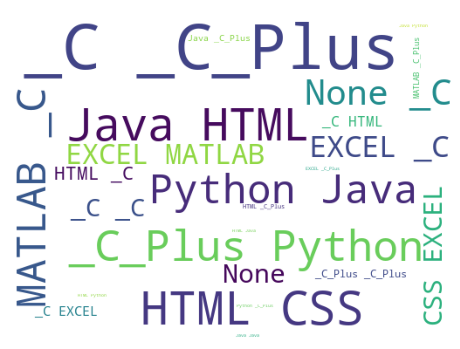

In [21]:
x2011 = df_lang['Programming Languages'].astype(str)
plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(x2011))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('programmin.tiff')

plt.show()

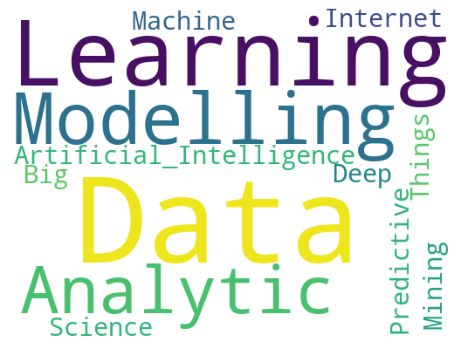

In [22]:
buzz_words=['Artificial_Intelligence','Machine Learning','Learning Analytics','Predictive Modelling','Deep Learning','Big Data','Data Science','Data Analytic','Internet of Things','Data Mining','Data Modelling']

plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(buzz_words))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('programmin.tiff')

plt.show()


In [23]:
df_pie=prep_data2(df_lang,'Programming Languages')
pieplot2(df_pie,'Programming Languages')
barplot2(df_pie,"Labels","count",'Programming Languages',"program_gate2020.html")

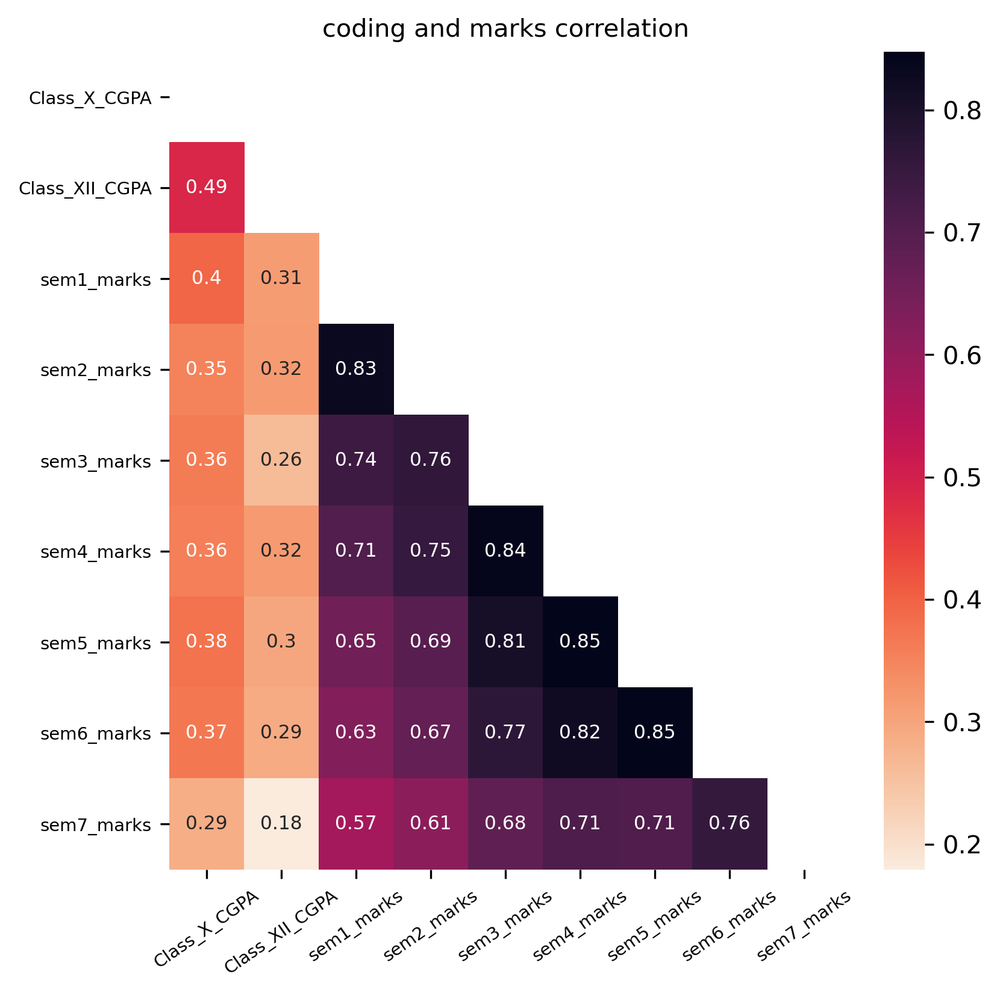

In [24]:

y=df[['Class_X_CGPA','Class_XII_CGPA','sem1_marks','sem2_marks','sem3_marks','sem4_marks','sem5_marks','sem6_marks','sem7_marks']]
    
corr_heat(y=y,title='coding and marks correlation',sfig="coding.tiff")

### Studying Linear Correlation

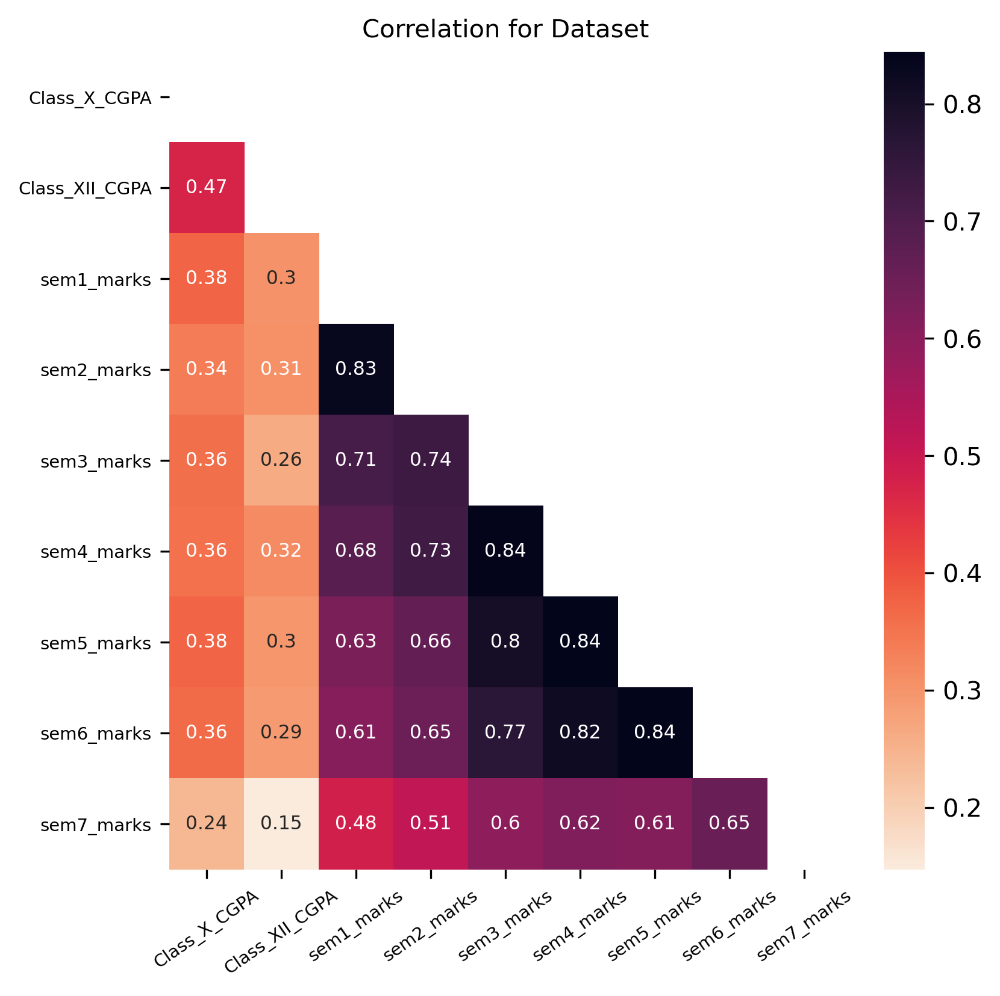

In [25]:
corr_heat(y=df_new,title="Correlation for Dataset",sfig="corr_data.tiff")

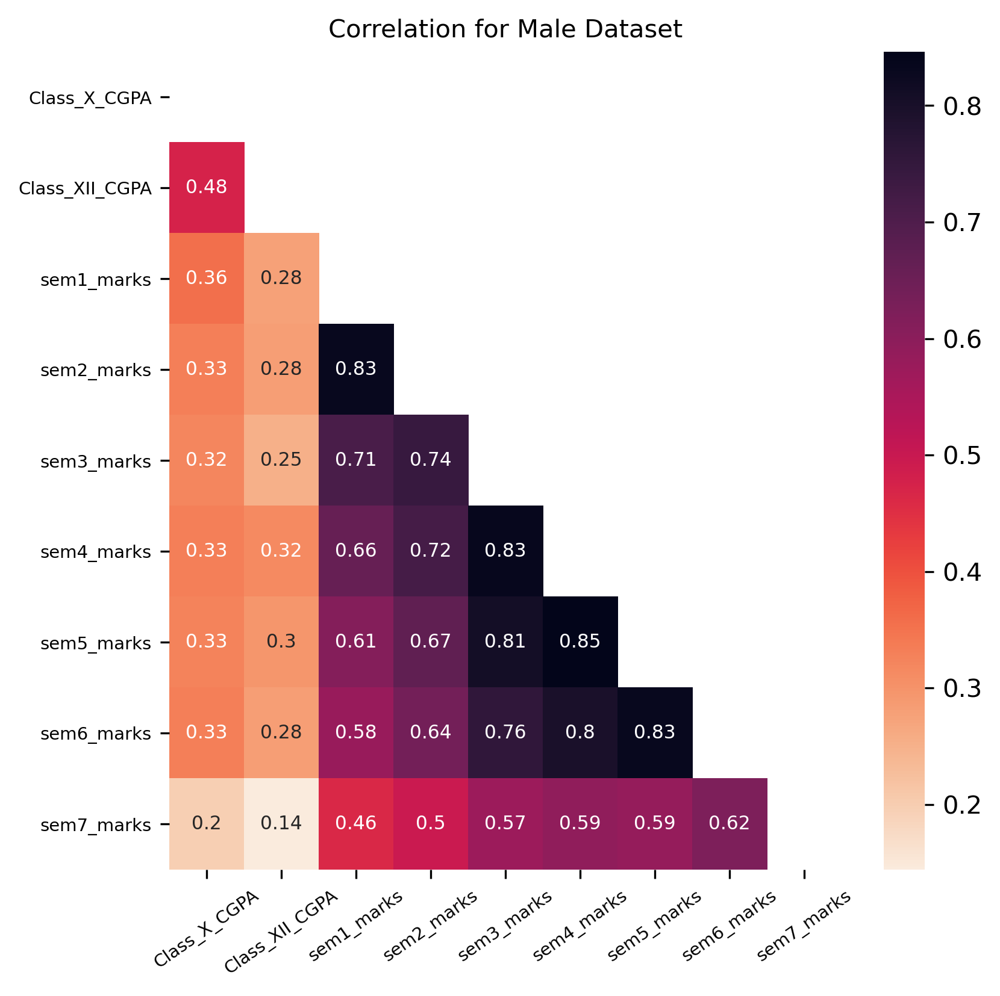

In [26]:
corr_heat(y=df_new_male,title="Correlation for Male Dataset",sfig="cor_male")

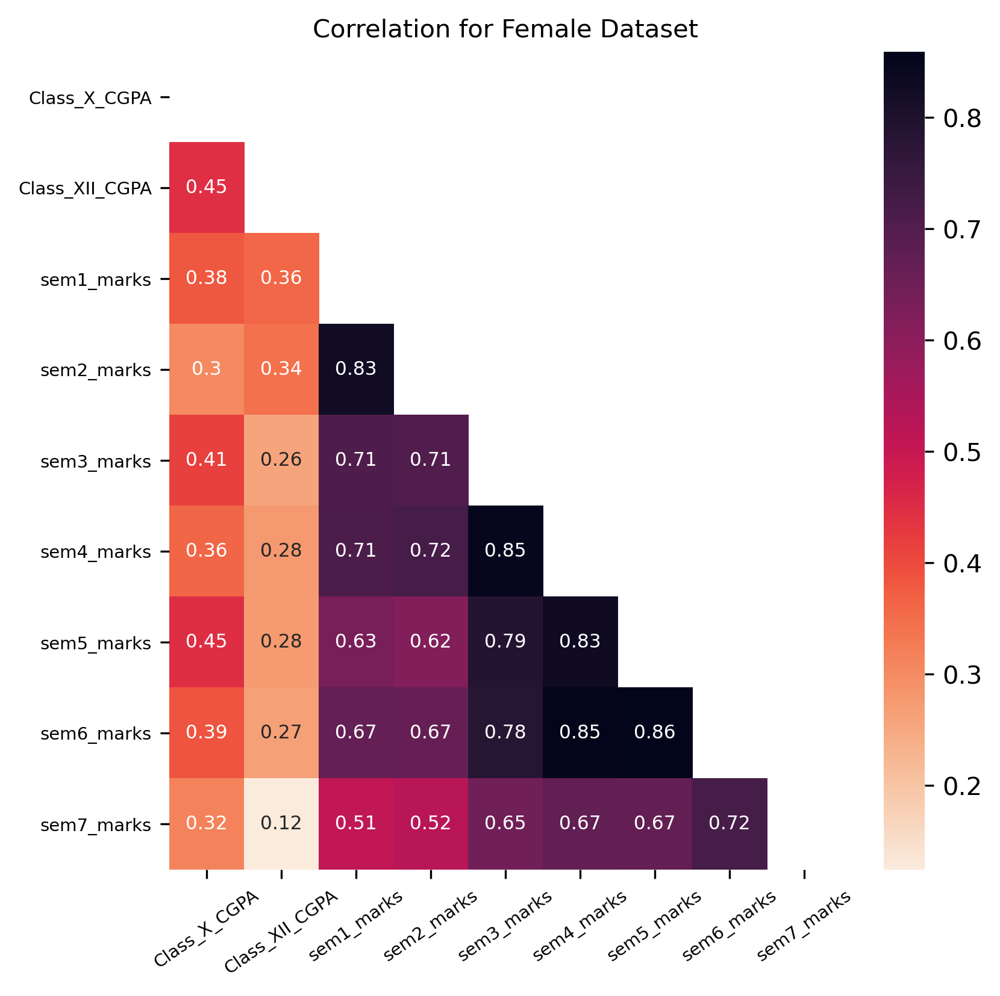

In [27]:
corr_heat(y=df_new_female,title="Correlation for Female Dataset",sfig="cor_female")

 ### GATE APPEARANCE STATS

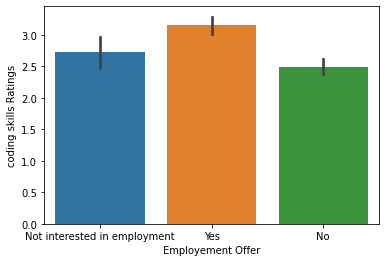

In [28]:
sns.barplot(y='coding skills Ratings',x='Employement Offer',data=df)
barplot(df,'Employement Offer','coding skills Ratings',"Employment VS Coding Skills","Employment VS Coding Skills.html")

In [29]:

df_pie=prep_data('Appeared in GATE 2020?')
pieplot(df_pie,'Students appearing for GATE 2020')
barplot(df_pie,"Labels","count","Students appearing for GATE 2020","students_for_gate2020.html")

df_pie=prep_data('GATE qualified')
pieplot(df_pie,'GATE2020 Exam Stats')
barplot(df_pie,"Labels","count",'GATE2020 Exam Stats',"qualifiers_for_gate2020.html")    

In [30]:
#Interest in GATE 
df_pie=prep_data('Interest in GATE ')
pieplot(df_pie,'Measuring the Interest of students in GATE ')
barplot(df_pie,"Labels","count",'Measuring the Interest of students in GATE',"int_for_gate2020.html")

In [31]:
df_pie=prep_data('Does your institute have GATE aligned courses in B.Tech.?')
pieplot(df_pie,'Poll for GATE Aligned Curriculum in B.Tech')
barplot(df_pie,"Labels","count","GATE aligned curriculum","curriculum_for_gate2020.html")
#Internship

In [32]:
df_pie=prep_data('Internship')
pieplot(df_pie,'Stats related to # of students doing internship during their B.Tech')
barplot(df_pie,"Labels","count","Stats related to # of students doing internship during their B.Tech","interns_for_gate2020.html")
#Internship

#Usefulness of Internship
df_pie=prep_data('Usefulness of Internship')
pieplot(df_pie,'Usefulness of Internship')
barplot(df_pie,"Labels","count","Usefulness of Internship","use_intern_for_gate2020.html")
#coding skills Ratings

In [33]:
df_pie=prep_data('coding skills Ratings')
pieplot(df_pie,'Coding Skills Ratings')
barplot(df_pie,"Labels","count","Coding Skills Ratings","coding_skills_for_gate2020.html")
#coding skills Ratings

#Employement Offer

In [34]:
df_pie=prep_data('Employement Offer')
pieplot(df_pie,'Employement Offer')
barplot(df_pie,"Labels","count","Employement Offer","emp_for_gate2020.html")
#coding skills Ratings

#Employement Offer

In [35]:
df_pie=prep_data('Gender')
pieplot(df_pie,'Gender')
#coding skills Ratings

In [36]:
barplot(df_pie,"Labels","count","Gender","gender_gate2020.html")


In [37]:
df_pie=prep_data('Sections')
pieplot(df_pie,'Sections')
barplot(df_pie,"Labels","count","Sections","category_gate2020.html")
#coding skills Ratings

#Employement Offer

In [38]:
from wordcloud import WordCloud, STOPWORDS

In [39]:
df.columns


Index(['Full Name', 'Btech Branch', 'Institute', 'Gender', 'Sections',
       'Home state', 'sem1_marks', 'sem2_marks', 'sem3_marks', 'sem4_marks',
       'sem5_marks', 'sem6_marks', 'sem7_marks', 'Class_X_CGPA',
       'Class X Board', 'Class_XII_CGPA', 'Class XII Board ',
       'Rank in JEE-Main ', 'JEE-Main marks ', 'Appeared in GATE 2020?',
       'Please provide your GATE Registration Number. If NA then please write NA: Not Applicable',
       'Gate Branch', 'GATE qualified',
       'Does your institute have GATE aligned courses in B.Tech.?',
       'GATE aligned suggestions', 'Interest in GATE ',
       'Reasons for GATE Ratings', 'Internship', 'Interning Organization NAme',
       'Internship Period', 'Usefulness of Internship',
       'If you have not done an internship during B.Tech., please mention the reason. If you have done an internship, please provide a reason for your choice in the last question',
       'Programming Languages', 'coding skills Ratings', 'Employement Of

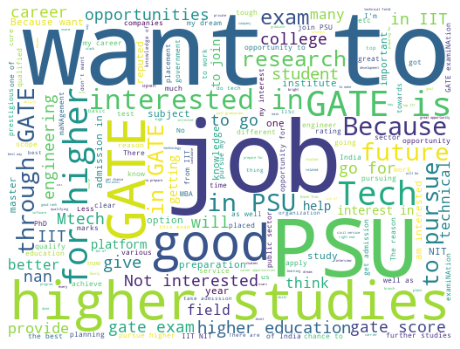

In [40]:
# data prepararion
x2011 = df['Reasons for GATE Ratings'].astype(str)
plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(x2011))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('gate_ratings.tiff')

plt.show()

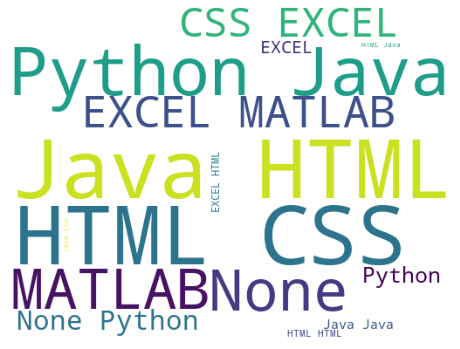

In [41]:
# data prepararion
x2011 = df['Programming Languages'].astype(str)
plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(x2011))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('programmin.tiff')

plt.show()

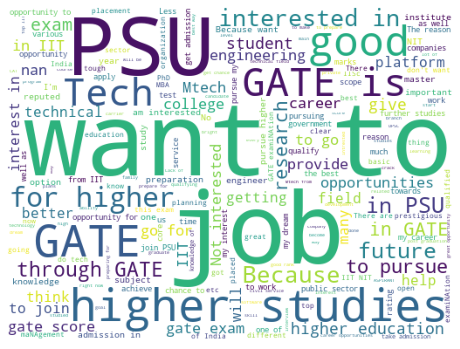

In [42]:
# data prepararion
x2011 = df['Reasons for GATE Ratings'].astype(str)
plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(x2011))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('gate_int.tiff')

plt.show()

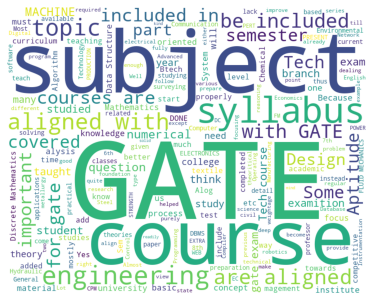

In [43]:
data =df['GATE aligned suggestions'].dropna()
data=data.astype(str)
#data = data.dropna()
words = ' '.join(data)
cleanedList = [x for x in words if str(x) != 'nan']
#processed_words = ' '.join([word for word in words.split() if word not in 'nan'])
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=640).generate(words)
#plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig('curriculum_suggestions.tiff')
plt.show()


    

In [44]:
print(plt.style.available) #You can see all of the available styles you currently have by doing:

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


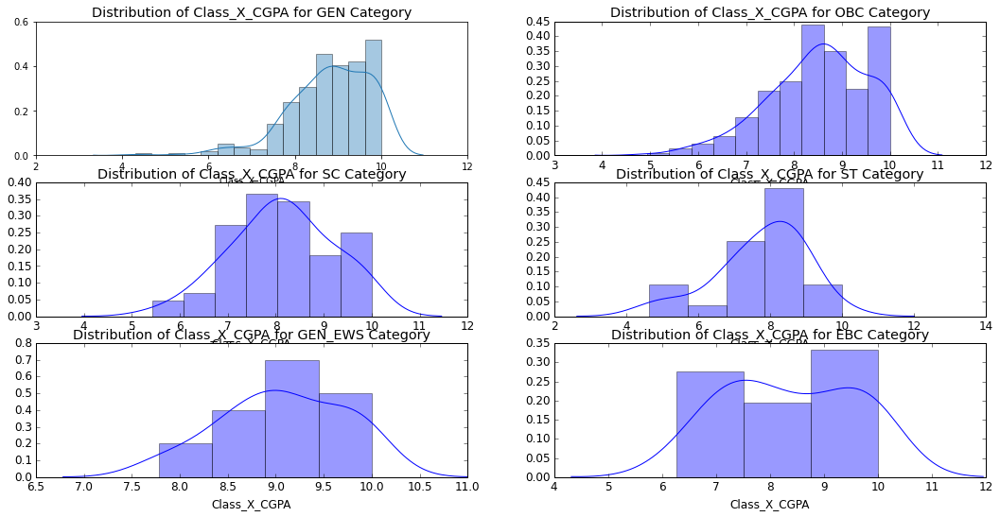

In [45]:
sns_dist('Class_X_CGPA')

In [46]:
#sns_dist('Class_XII_CGPA')

In [47]:
#sns_dist('sem1_marks')

In [48]:
#sns_dist('sem2_marks')

In [49]:
#sns_dist('sem3_marks')

In [50]:
#sns_dist('sem4_marks')

In [51]:
#sns_dist('sem5_marks')

In [52]:
#sns_dist('sem6_marks')

In [53]:
box_cat(df,"Study Pattern")

In [54]:
box_cat(df_new_male,"Study pattern: Male")

In [55]:
box_cat(df_new_female,"Study Pattern: Female")

In [56]:
box_cat(df_new_gen,"Study Pattern Category: General")

In [57]:
box_cat(df_new_obc,"Study Pattern Category: OBC")

In [58]:
box_cat(df_new_sc,"Study Pattern Category: SC")


In [59]:
box_cat(df_new_st,"Study Pattern Category: ST")


In [60]:
box_cat(df_new_gen_ews,"Study Pattern GEN_EWS")
box_cat(df_new_ebc,"Study Pattern EBC")

In [61]:
x_samehist('Class_X_CGPA','Class X CGPA')

In [62]:
x_samehist('Class_XII_CGPA','Class XII CGPA')

In [63]:
x_samehist('sem1_marks','Sem 1 CGPA')

In [64]:
x_samehist('sem2_marks','Sem 2 CGPA')

In [65]:
x_samehist('sem3_marks','Sem 3 CGPA')

In [66]:
x_samehist('sem4_marks','Sem 4 CGPA')

In [67]:
x_samehist('sem5_marks','Sem 5 CGPA')

In [68]:
x_samehist('sem6_marks','Sem 6 CGPA')

In [69]:
#hist_subplot('Class_X_CGPA','CGPA in Class X')
#x_samehist('sem3_marks')

In [70]:
#hist_subplot('Class_XII_CGPA','CGPA in Class XII')
#x_samehist('sem3_marks')

In [71]:
#hist_subplot('sem1_marks','CGPA in Semester 1')
#x_samehist('sem1_marks',"CGPA in sem1")

In [72]:
#hist_subplot('sem2_marks','CGPA in Semester 2')
#x_samehist('sem2_marks')

In [73]:
#hist_subplot('sem3_marks','CGPA in Semester 3')
#x_samehist('sem3_marks')

In [74]:
#hist_subplot('sem4_marks','CGPA in Semester 4')
#x_samehist('sem3_marks')

In [75]:
#hist_subplot('sem5_marks','CGPA in Semester 5')
#x_samehist('sem3_marks')

In [76]:
#hist_subplot('sem6_marks','CGPA in Semester 6')
#x_samehist('sem3_marks')

In [77]:
hist('Class_X_CGPA')

In [78]:
hist('Class_XII_CGPA')

In [79]:
hist('sem1_marks')

In [80]:
hist('sem2_marks')

In [81]:
hist('sem3_marks')

In [82]:
hist('sem4_marks')

In [83]:
hist('sem5_marks')

In [84]:
hist('sem6_marks')

In [85]:
df.columns

Index(['Full Name', 'Btech Branch', 'Institute', 'Gender', 'Sections',
       'Home state', 'sem1_marks', 'sem2_marks', 'sem3_marks', 'sem4_marks',
       'sem5_marks', 'sem6_marks', 'sem7_marks', 'Class_X_CGPA',
       'Class X Board', 'Class_XII_CGPA', 'Class XII Board ',
       'Rank in JEE-Main ', 'JEE-Main marks ', 'Appeared in GATE 2020?',
       'Please provide your GATE Registration Number. If NA then please write NA: Not Applicable',
       'Gate Branch', 'GATE qualified',
       'Does your institute have GATE aligned courses in B.Tech.?',
       'GATE aligned suggestions', 'Interest in GATE ',
       'Reasons for GATE Ratings', 'Internship', 'Interning Organization NAme',
       'Internship Period', 'Usefulness of Internship',
       'If you have not done an internship during B.Tech., please mention the reason. If you have done an internship, please provide a reason for your choice in the last question',
       'Programming Languages', 'coding skills Ratings', 'Employement Of

In [86]:
#sns.voilinplot(y='coding skills Ratings',x='Employement Offer',data=df)
# Plot a violin plot of the average price vs. avocado type
#sns.violinplot(y='coding skills Ratings',x='Employement Offer',data=df)




fig1 = px.violin(df,y='coding skills Ratings',x='Employement Offer', box=True, # draw box plot inside the violin
                points='all', # can be 'outliers', or False
               )
#fig1.update_traces(texttemplate='%{text:.2s}', textposition='auto',textfont_size=18)
fig1.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
fig1.update_xaxes(tickfont=dict(family='Rockwell', color='black', size=18))
fig1.update_yaxes(tickfont=dict(family='Rockwell', color='black', size=18))
fig1.show()

In [87]:

fig = px.violin(df,y='coding skills Ratings',x='Employement Offer', color="Gender", box=True, points="all",
          hover_data=df.columns)
fig.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
fig.update_xaxes(tickfont=dict(family='Rockwell', color='black', size=18))
fig.update_yaxes(tickfont=dict(family='Rockwell', color='black', size=18))
fig.show()
